## Heat equation


Heat equation is a partial differential equation (PDE) that describes heat transfer between objects with different temperature. A typical heat equation is described by this expression:
$$\frac{\partial u}{\partial t}-\alpha \varDelta u=0$$

To solve the heat equation we can use the Fourier neural network approach. In this notebook we plot the solutions we generated using the standard solver and the predictions we obtained by using the Fourier neural network approach.


In [ ]:
import numpy as np
solver_solution=np.load('heat_groundtruth_0001.npy')
fourier_prediction=np.load('heat_prediction_0001.npy')

In [ ]:
fourier_prediction=fourier_prediction.reshape(1,32,32,40)
solver_solution=solver_solution.reshape(1,32,32,40)

In [ ]:
u_pred = np.concatenate((solver_solution,fourier_prediction), axis=2)
u_pred = np.concatenate((u_pred,abs(solver_solution-fourier_prediction)), axis=2)

In [ ]:
import torch
import scipy.io
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import Image

ims = []
fig = plt.figure(figsize=(18,9))
for i in range(40):
    im = plt.pcolormesh(u_pred[0,:, :, i],cmap='Reds')
    ims.append([im])
    plt.plot([32, 32], [32, 0], 'k-', linewidth=1)
   
#plt.title('u (left) pred (right)')
plt.axis('off')
ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=0)

ani.save('u+pred+diff.gif', dpi=200, writer='pillow', fps=3)

plt.show()

Prediction with a 2-D Fourier neural network


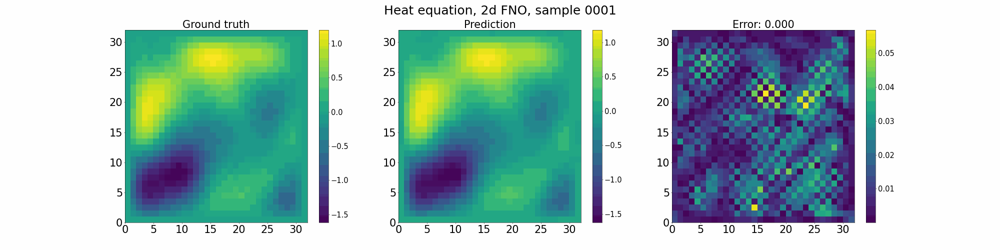

In [ ]:
print('Prediction with a 2-D Fourier neural network')
Image(open('heat_2d_eval_0001.gif','rb').read())

Prediction with a 3-D Fourier neural network


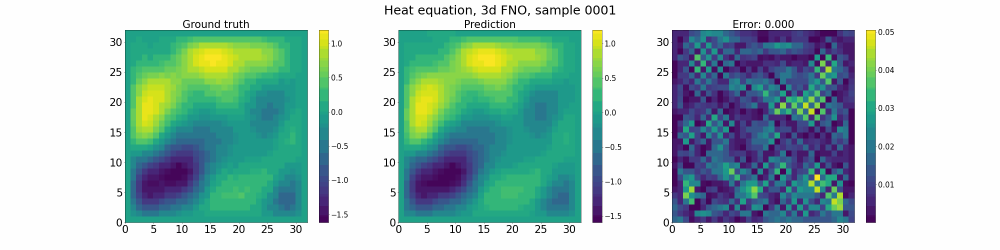

In [ ]:
print('Prediction with a 3-D Fourier neural network')
Image(open('heat_3d_eval_0001.gif','rb').read())